<a href="https://colab.research.google.com/github/josephzonghaozhu/oct-classification/blob/main/Retinal_OCT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#RETINAL OCT - image classification

# About the Dataset

Ocular Coherence Tomography (OCT) images labelled as Choroidal neovascularization (CNV) / Diabetic macular edema (DME) / Drusen / Normal.

In [ ]:
import os
import zipfile

In [ ]:
from google.colab import files
 
uploaded = files.upload()
 
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# move kaggle.json into the folder where the API expects to find it
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 72 bytes


In [ ]:
!kaggle datasets download -d paultimothymooney/kermany2018

100% 10.8G/10.8G [04:05<00:00, 18.3MB/s]
100% 10.8G/10.8G [04:05<00:00, 47.5MB/s]


In [ ]:
os.mkdir('/content/model')
 
local_zip = '/content/kermany2018.zip'
archive = zipfile.ZipFile(local_zip, 'r')

In [ ]:
print('peek: ', archive.namelist()[:3])
 
for file in archive.namelist():
  if file.startswith('OCT2017 /'):
    archive.extract(file, '/content/model')

!rm kermany2018.zip   

peek:  ['OCT2017 /test/CNV/CNV-1016042-1.jpeg', 'OCT2017 /test/CNV/CNV-1016042-2.jpeg', 'OCT2017 /test/CNV/CNV-1016042-3.jpeg']


In [ ]:
DATA_DIR = '/content/model/OCT2017 '
TEST_DIR = DATA_DIR + '/test'
TRAIN_DIR = DATA_DIR + '/train'
VAL_DIR = DATA_DIR + '/val'

classes = ['CNV', 'DME', 'DRUSEN', 'NORMAL']
print('classes: ', classes)

classes:  ['CNV', 'DME', 'DRUSEN', 'NORMAL']


# INSPECT RAW DATA

In [ ]:
import glob
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from PIL import Image

In [ ]:
def print_images_info(dir):
    files = glob.glob(dir + '/*')
    data = {}
    #data['count'] = len(files)
    data['min_width'] = []
    data['max_width'] = []
    data['min_height'] = []
    data['max_height'] = []

    for f in files:
        im = Image.open(f)
        w, h = im.size
        data['min_width'].append(w)
        data['min_height'].append(h) 
        data['max_width'].append(w)       
        data['max_height'].append(h) 
    
    data['min_width'] = min(data['min_width'])
    data['min_height'] = min(data['min_height'])
    data['max_width'] = max(data['max_width'])
    data['max_height'] = max(data['max_height'])
   
    print('image_directory\t:', dir) 
    for k, v in data.items():
        print('%s\t: %s' % (k, v))

In [ ]:
print('___TRAIN___')     
for dir in glob.glob(TRAIN_DIR + '/*'):
  print_images_info(dir)
print('\n', '___TEST___')     
for dir in glob.glob(TEST_DIR + '/*'):
  print_images_info(dir)
print('\n', '___VALIDATION___')  
for dir in glob.glob(VAL_DIR + '/*'):
  print_images_info(dir)

___TRAIN___
image_directory	: /content/model/OCT2017 /train/CNV
min_width	: 384
max_width	: 1536
min_height	: 496
max_height	: 496
image_directory	: /content/model/OCT2017 /train/DME
min_width	: 512
max_width	: 1536
min_height	: 496
max_height	: 512
image_directory	: /content/model/OCT2017 /train/NORMAL
min_width	: 384
max_width	: 1536
min_height	: 496
max_height	: 512
image_directory	: /content/model/OCT2017 /train/DRUSEN
min_width	: 512
max_width	: 1536
min_height	: 496
max_height	: 496

 ___TEST___
image_directory	: /content/model/OCT2017 /test/CNV
min_width	: 512
max_width	: 768
min_height	: 496
max_height	: 496
image_directory	: /content/model/OCT2017 /test/DME
min_width	: 512
max_width	: 1536
min_height	: 496
max_height	: 496
image_directory	: /content/model/OCT2017 /test/NORMAL
min_width	: 512
max_width	: 768
min_height	: 496
max_height	: 496
image_directory	: /content/model/OCT2017 /test/DRUSEN
min_width	: 512
max_width	: 768
min_height	: 496
max_height	: 496

 ___VALIDATION___

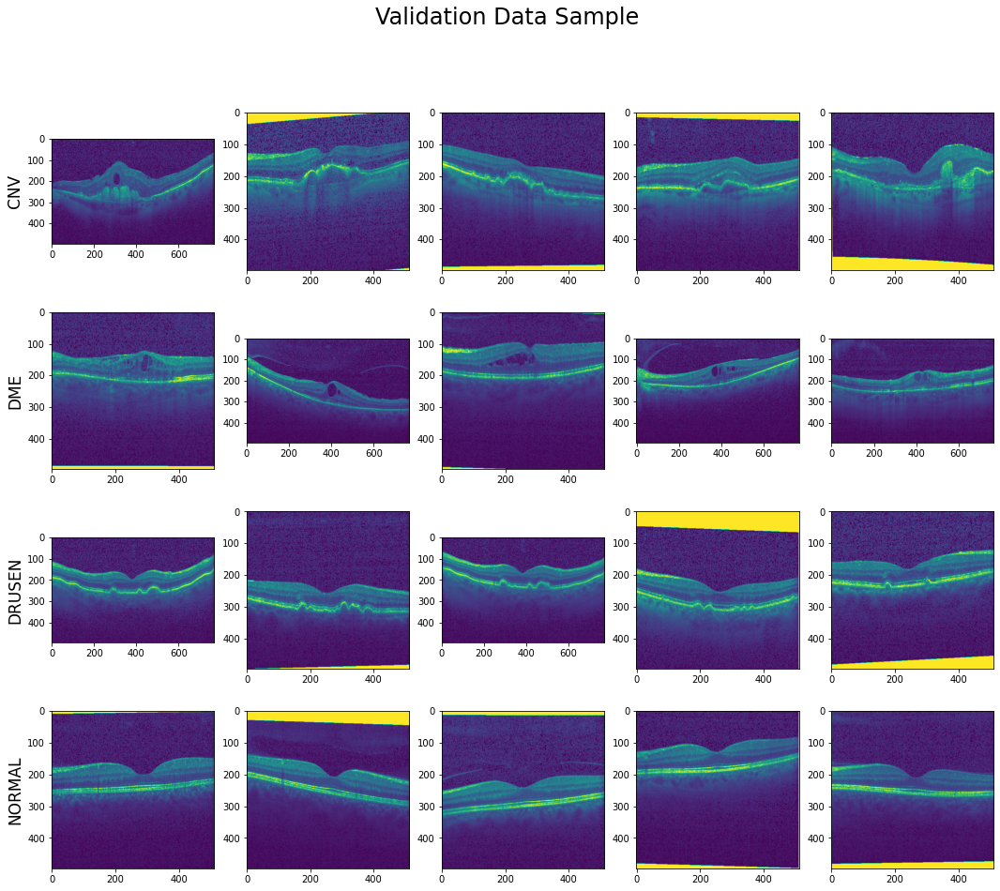

In [ ]:
cnv_examples = glob.glob(VAL_DIR + '/CNV/*')
dme_examples = glob.glob(VAL_DIR + '/DME/*')
drusen_examples = glob.glob(VAL_DIR + '/DRUSEN/*')
normal_examples = glob.glob(VAL_DIR + '/NORMAL/*')

pics = cnv_examples[:5] + dme_examples[:5] + drusen_examples[:5] + normal_examples[:5]

fig = plt.figure(figsize=(18,15))
rows = 4
columns = 5

for i, pic in enumerate(pics):
  img = plt.imread(pics[i])
  sp = plt.subplot(rows, columns, i+1) 
  plt.imshow(img)
  if i%5 == 0:
    plt.ylabel(classes[int(i/5)], fontsize=17)
  if i == rows*columns-1:
    plt.suptitle('Validation Data Sample', fontsize=24)

# CLASS IMBALANCE

In [ ]:
import pandas as pd

In [ ]:
data = {}

for dir in [TRAIN_DIR, TEST_DIR, VAL_DIR]:
  dir_tail = os.path.basename(dir)
  data[dir_tail.upper()] = []
  for c in classes:
    files = os.listdir(dir + '/' + c)
    data[dir_tail.upper()].append(len(files))

df = pd.DataFrame(data, index=classes) 
df

,TRAIN,TEST,VAL
CNV,37205,242,8
DME,11348,242,8
DRUSEN,8616,242,8
NORMAL,26315,242,8


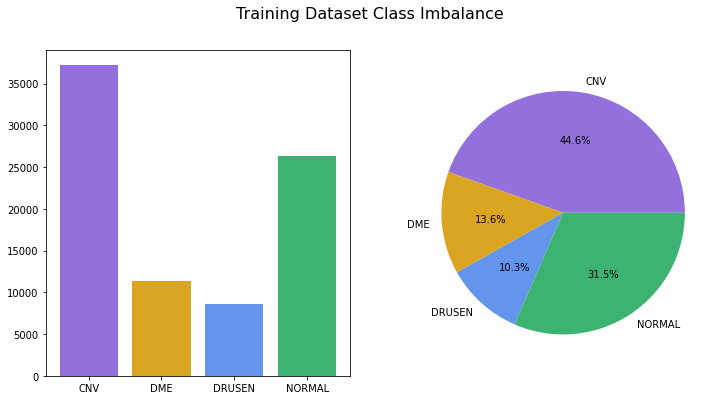

In [ ]:
colors = ['mediumpurple', 'goldenrod', 'cornflowerblue', 'mediumseagreen']

fig = plt.figure(figsize=(12, 6))

plt.subplot(1,2,1)
plt.bar(classes, data['TRAIN'], color=colors)

plt.subplot(1,2,2)
plt.pie(np.array(data['TRAIN']), labels=classes, colors=colors, autopct='%1.1f%%')

plt.suptitle('Training Dataset Class Imbalance', fontsize=16)
plt.show()

# HYPERPARAMETERS

In [ ]:
import math

In [ ]:
# hyperparameters

target_w = target_h = 150         #150, 200
batch_size = 16

epochs = 5      # decreased epochs to circumvent google colab restrictions, continue further training in a new session

initial_lr = 0.001; k = 0.15      

# learning rate

def lr_decay_exp(epoch, lr):
    return initial_lr * math.exp(-k*epoch)

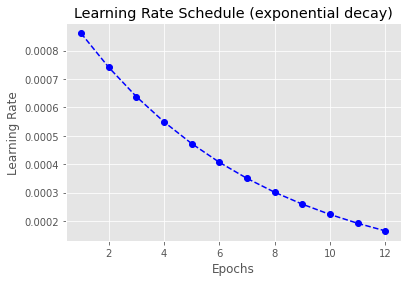

In [ ]:
#from cycler import cycler
#print(plt.style.available)
plt.style.use('ggplot')     

lr_y = []
ep_x = []

for i in range(1, epochs+1):
    lr = lr_decay_exp(i, initial_lr)
    lr_y.append(lr)
    ep_x.append(i)

plt.plot(ep_x, lr_y, 'bo--')
plt.xlabel('Epochs')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedule (exponential decay)')
plt.show()

# MODEL TRAINING

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.optimizers import *
#from keras.optimizers import SGD, RMSprop, Adam, Adagrad, Adadelta, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras.utils.vis_utils import plot_model

tf.__version__
#!pip show tensorflow  # 1.6.0
#!pip show keras  # 2.1.5

'2.6.0'

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255)      #no image augmentation
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(target_w,target_h),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(target_w,target_h),
    batch_size=batch_size,
    class_mode='categorical')

Found 83484 images belonging to 4 classes.
Found 968 images belonging to 4 classes.


In [ ]:
# class balancing
# scaling by *0.25 keeps the loss to a similar magnitude (else arbitrarily raised), sum of the weights remains the same

from collections import Counter

count = Counter(train_generator.classes)
total = float(sum(count.values()))

class_weights = {}
for class_id, num_images in count.items():
  class_weights[class_id] = round((total/num_images)*0.25, 8)    

print(class_weights)

{0: 0.56097299, 1: 1.83917871, 2: 2.42235376, 3: 0.79312179}


In [ ]:
callback_save = tf.keras.callbacks.ModelCheckpoint('/content/model/saved', 
                                                   monitor='val_accuracy', 
                                                   verbose=0, 
                                                   save_best_only=True,
                                                   save_weights_only=False, 
                                                   mode='max', 
                                                   save_freq='epoch')

callback_lr = tf.keras.callbacks.LearningRateScheduler(lr_decay_exp, verbose=1)

callback_stop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=2, restore_best_weights=False, verbose=1)

In [ ]:
#Tensorboard

#%load_ext tensorboard
#
#os.mkdir('/content/logs')
#callback_tboard = tf.keras.callbacks.TensorBoard(
#    log_dir='/content/logs', write_graph=True,
#    write_images=True, update_freq='epoch')
#
#%tensorboard — logdir logs   #starts tboard
#rm -rf ./logs/      #clears logs

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(256, (3,3), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(256, (3,3), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Conv2D(128, (5,5), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128, (5,5), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(32, (5,5), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(target_w, target_h, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation='softmax')
])

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer='adam',          
              metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 256)     7168      
_________________________________________________________________
batch_normalization (BatchNo (None, 148, 148, 256)     1024      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 146, 146, 256)     590080    
_________________________________________________________________
batch_normalization_1 (Batch (None, 146, 146, 256)     1024      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 73, 73, 256)       0         
_________________________________________________________________
dropout (Dropout)            (None, 73, 73, 256)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 69, 69, 128)       8

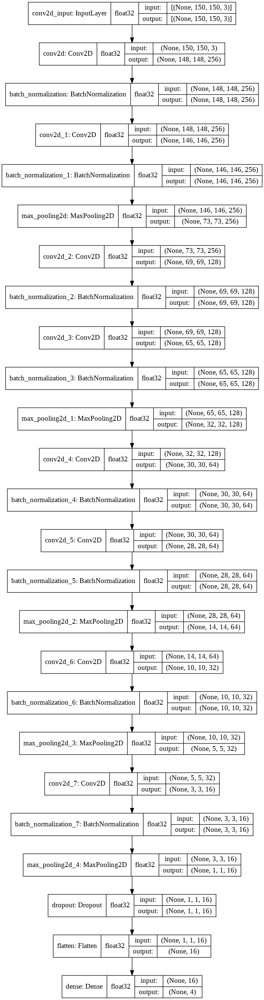

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=True, show_dtype=True,
    show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch = train_generator.samples//batch_size,          
    validation_data = test_generator, 
    validation_steps = test_generator.samples//batch_size,
    epochs=epochs, 
    class_weight = class_weights,
    callbacks = [callback_lr, callback_stop, callback_save]
)

In [ ]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(15, 4))

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

plt.subplot(1,2,1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Loss')
plt.legend(loc=0)

plt.subplot(1,2,2)
plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Accuracy')
plt.legend(loc=0)

plt.subplots_adjust(wspace=0.3)
plt.show()

In [ ]:
#model.save('/content/model/model')
#!zip -r /content/model.zip /content/model/model

# MODEL EVALUATION

In [ ]:
# Confusion Matrix
from keras.utils.np_utils import to_categorical
import cv2

test_paths = glob.glob(TEST_DIR + '/*/*.jpeg')
x_test = []
y_test = []
for i in range(len(test_paths)):
  img = cv2.imread(test_paths[i])
  img = cv2.resize(img, (target_w,target_h))      #.resize accounts for 'color' channel     
  img = np.array(img/255.0)
  x_test.append(img)
  if 'CNV' in test_paths[i]:      #tf orders classes alphabetically
    y_test.append(0)
  elif 'DME' in test_paths[i]:
    y_test.append(1)
  elif 'DRUSEN' in test_paths[i]:
    y_test.append(2)
  elif 'NORMAL' in test_paths[i]:
    y_test.append(3)

y_test = np.array(y_test)
x_test = np.array(x_test)
print(x_test.shape, y_test.shape)

y_test_cat = tf.keras.utils.to_categorical(y_test)      #or manually ohe
model.evaluate(x_test, y_test_cat)     

y_pred = model.predict(x_test)
y_pred = np.argmax(y_pred,axis=1)

(968, 150, 150, 3) (968,)
31/31 [==============================] - 538s 17s/step - loss: 0.0117 - accuracy: 0.9990


In [ ]:
import sklearn.metrics

cm = sklearn.metrics.confusion_matrix(y_test, y_pred)     
print('Confusion matrix', '\n', cm)

cm_norm = cm / cm.sum(axis=1)
print('\n', 'Normalized', '\n', cm_norm)

Confusion matrix 
 [[241   1   0   0]
 [  0 242   0   0]
 [  0   0 242   0]
 [  0   0   0 242]]

 Normalized 
 [[0.99586777 0.00413223 0.         0.        ]
 [0.         1.         0.         0.        ]
 [0.         0.         1.         0.        ]
 [0.         0.         0.         1.        ]]


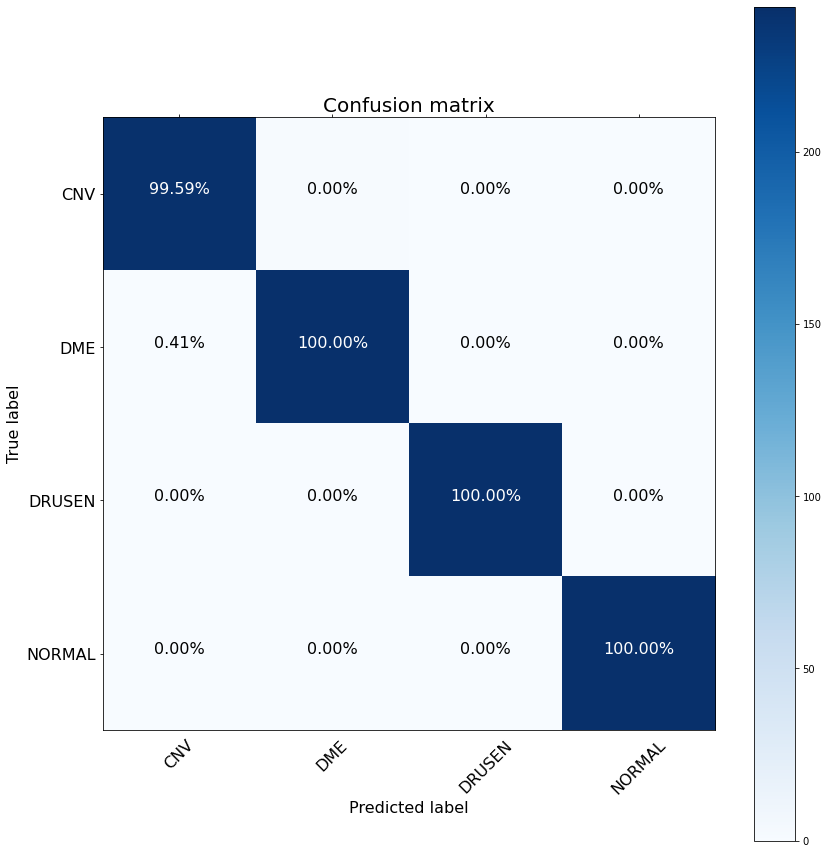

In [ ]:
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=20)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.rcParams['xtick.top'] = True 
    plt.rcParams['xtick.bottom'] = False 
    plt.xticks(tick_marks, classes, rotation=45, fontsize=16)
    plt.yticks(tick_marks, classes, fontsize=16)

    #fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, "{:0.2f}%".format(cm_norm[j][i] * 100),         #alternate format qty instead of %: , format(cm[i, j], fmt), #cm_norm & normalize=False: to preserve scale as qty cf. %
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black", fontsize=16) 

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16)
    plt.xlabel('Predicted label', fontsize=16)

plt.figure(figsize=(12,12))
plt.grid(b=False)
plot_confusion_matrix(cm, classes=classes, normalize=False, 
                      title='Confusion matrix', cmap = plt.cm.Blues)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, target_names=classes))

              precision    recall  f1-score   support

         CNV       1.00      1.00      1.00       242
         DME       1.00      1.00      1.00       242
      DRUSEN       1.00      1.00      1.00       242
      NORMAL       1.00      1.00      1.00       242

    accuracy                           1.00       968
   macro avg       1.00      1.00      1.00       968
weighted avg       1.00      1.00      1.00       968



In [ ]:
# image conv filters

#def get_name_layer_filters(model):
#    filter_whole=[]
#    layer_whole=[]
#    for layer in model.layers:
#        if 'conv' not in layer.name:
#            continue
#        filters,biases=layer.get_weights()
#        filter_whole.append(filters)
#        layer_whole.append(biases)
#       print(layer.name,filters.shape)
#    return filter_whole,layer_whole 

#filter_whole,layer_whole=get_name_layer_filters(model)

In [ ]:
#filters,biases=model.layers[0].get_weights()
#print(filters)
#print(biases)

In [ ]:
#f_min,f_max=filters.min(),filters.max()
#filters=(filters-f_min)/(f_max-f_min)
#print(filters)

In [ ]:
#from matplotlib import pyplot
#n_filters,ix=6,1
#for i in range(n_filters):
#    f=filters[:,:,:,i]
#    #plot each channel
#    for j in range(3):
#        ax=pyplot.subplot(n_filters,3,ix)
#        ax.set_xticks([])
#        ax.set_yticks([])
#        #plot filter channel
#        pyplot.imshow(f[:,:,j])
#        ix+=1
        
#pyplot.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array   #alrdy imported
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

!pip install keract
import keract
from keract import display_activations

conv2d (1, 148, 148, 256) 


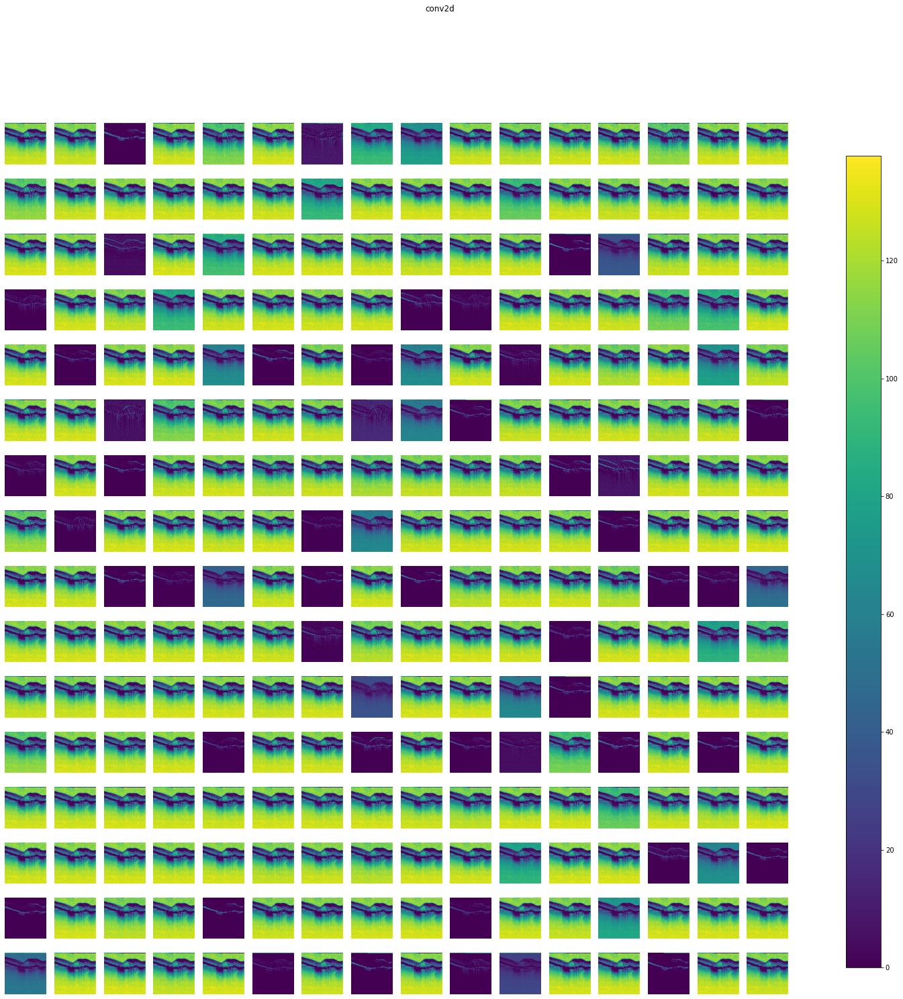

batch_normalization (1, 148, 148, 256) 


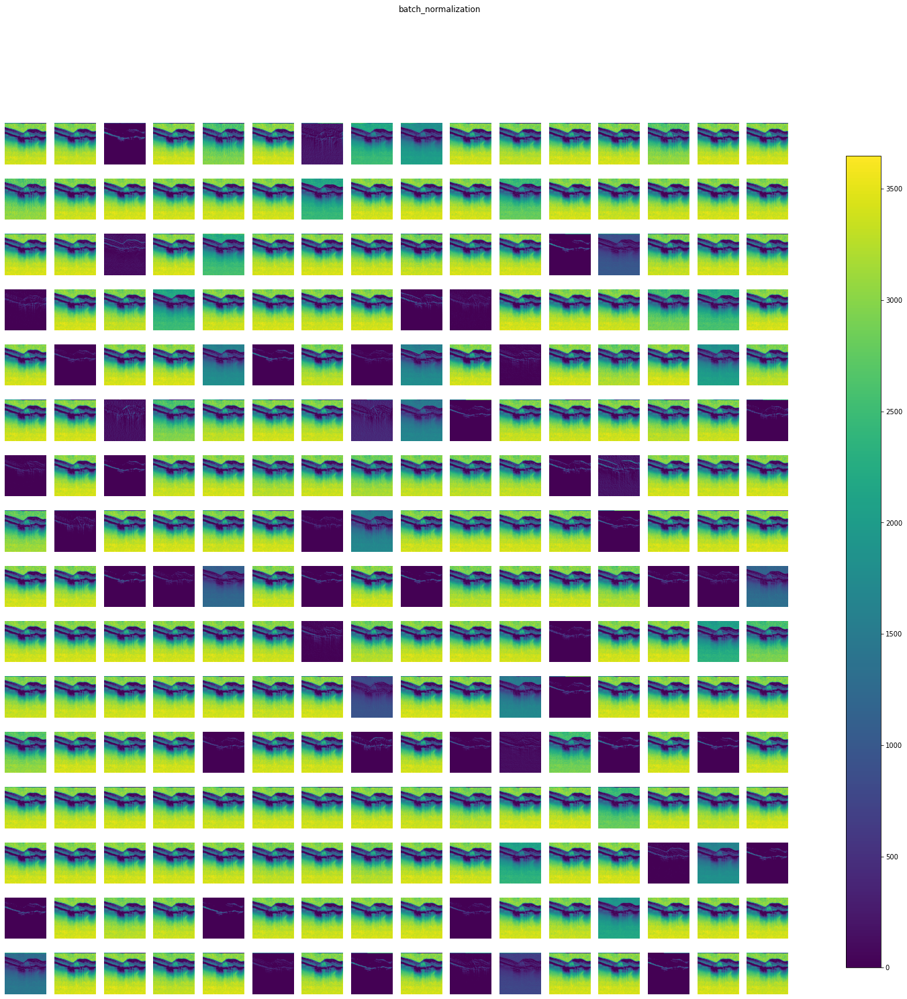

conv2d_1 (1, 146, 146, 256) 


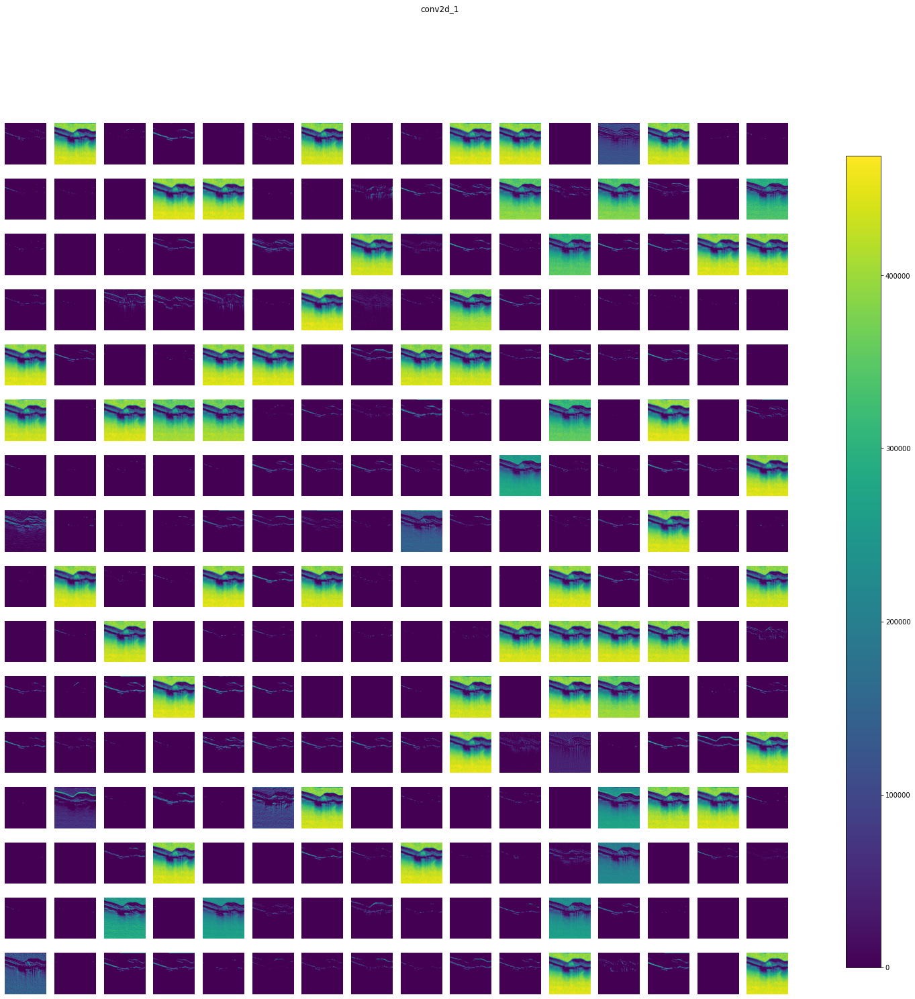

batch_normalization_1 (1, 146, 146, 256) 


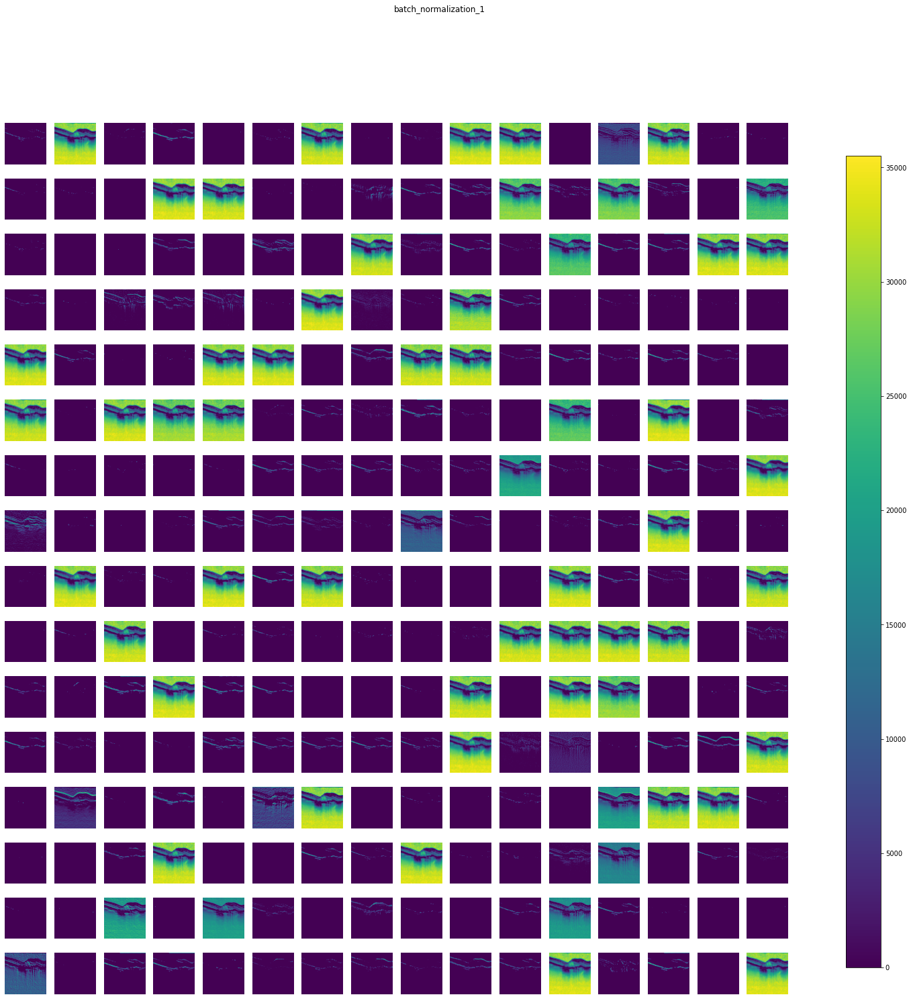

max_pooling2d (1, 73, 73, 256) 


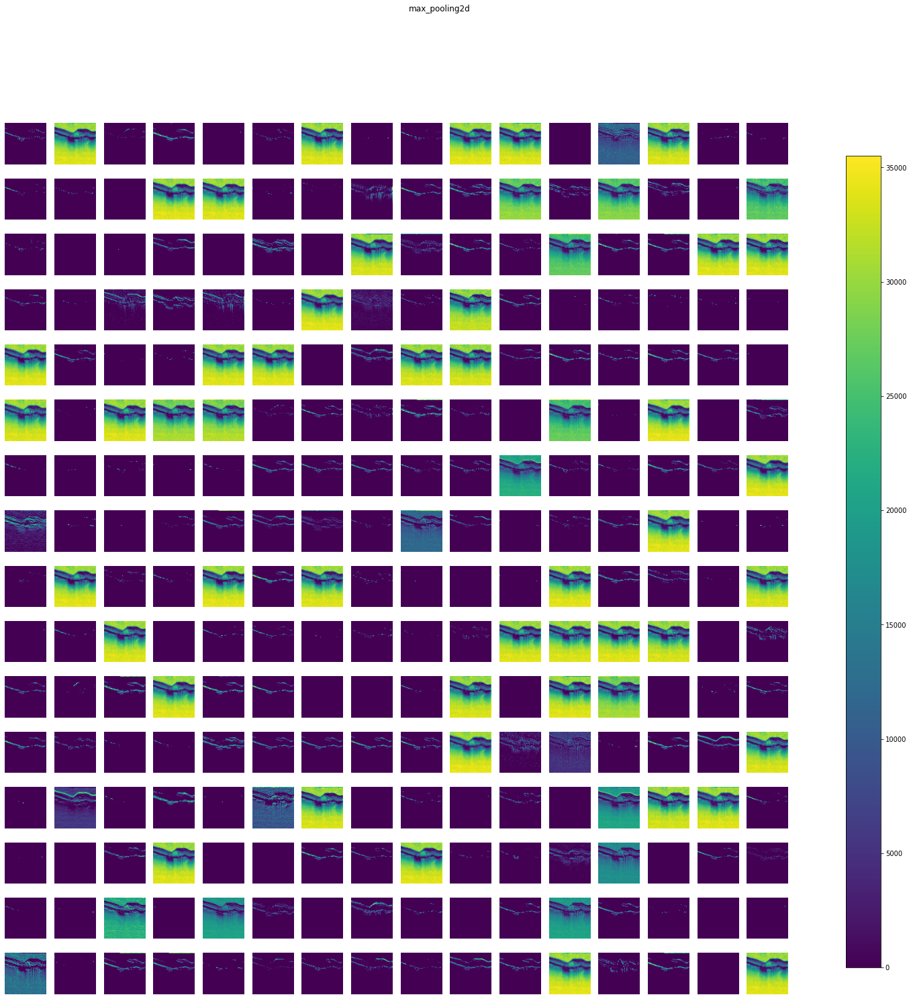

conv2d_2 (1, 69, 69, 128) 


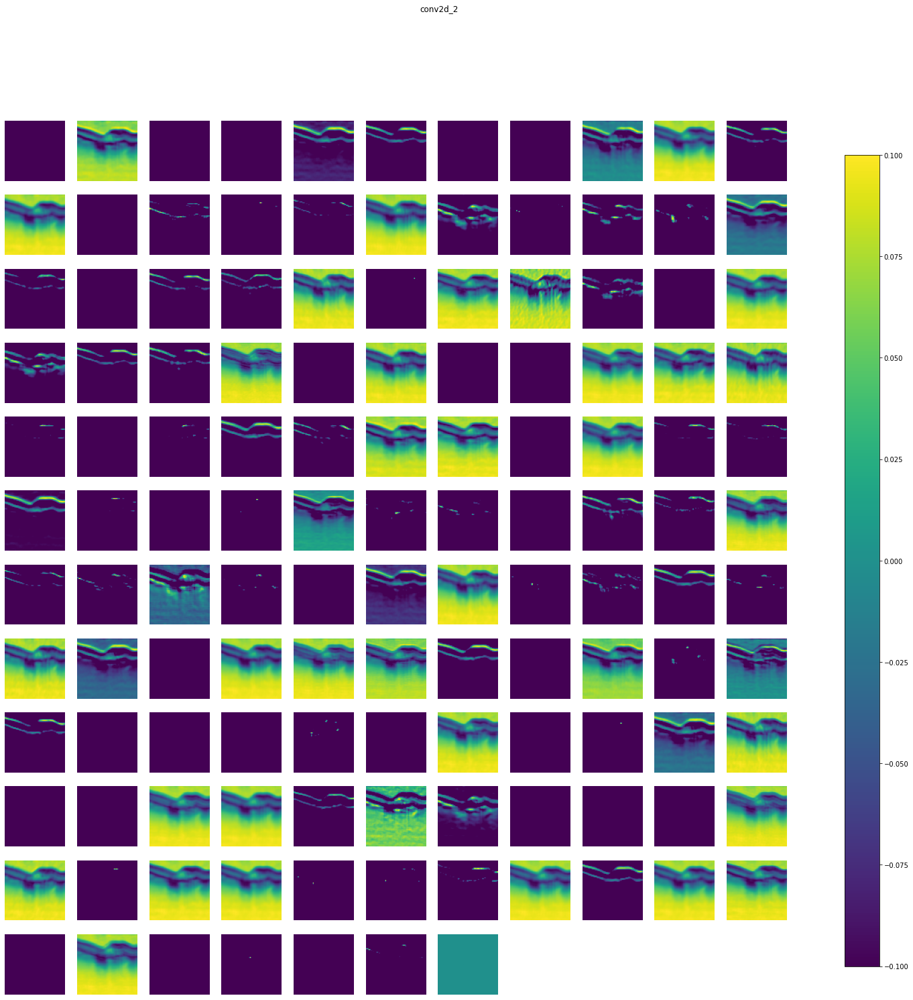

batch_normalization_2 (1, 69, 69, 128) 


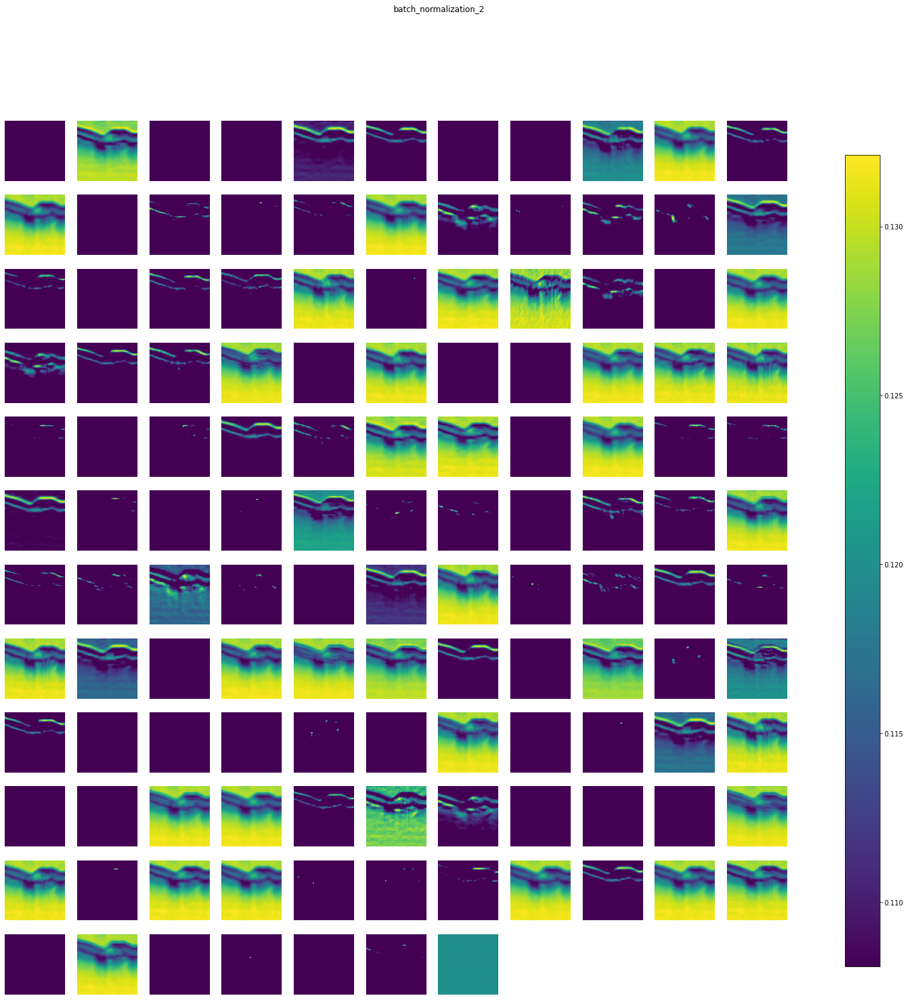

conv2d_3 (1, 65, 65, 128) 


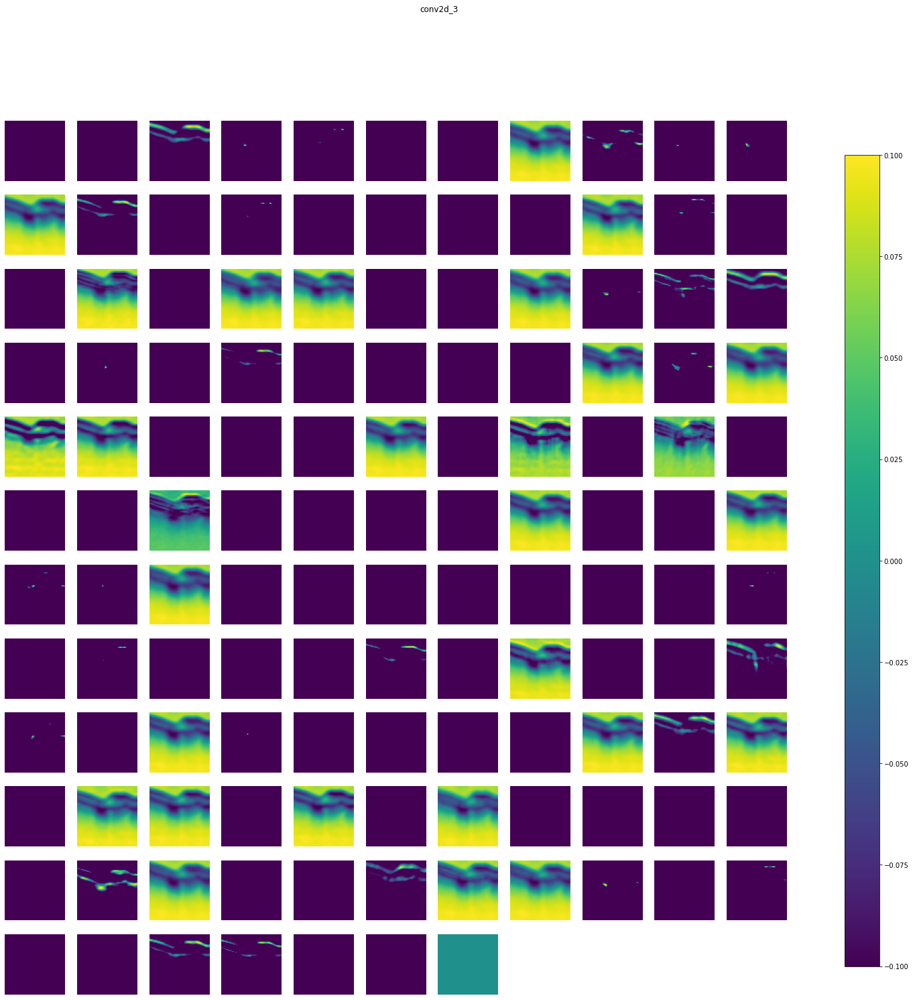

batch_normalization_3 (1, 65, 65, 128) 


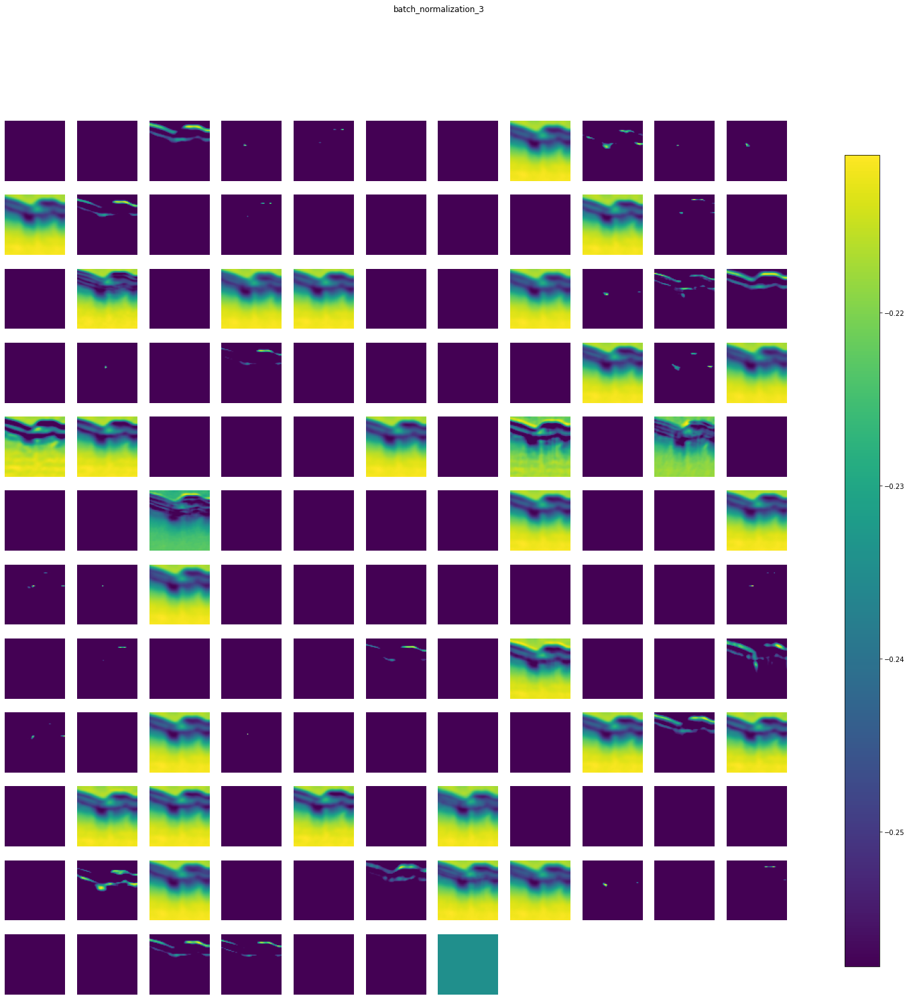

max_pooling2d_1 (1, 32, 32, 128) 


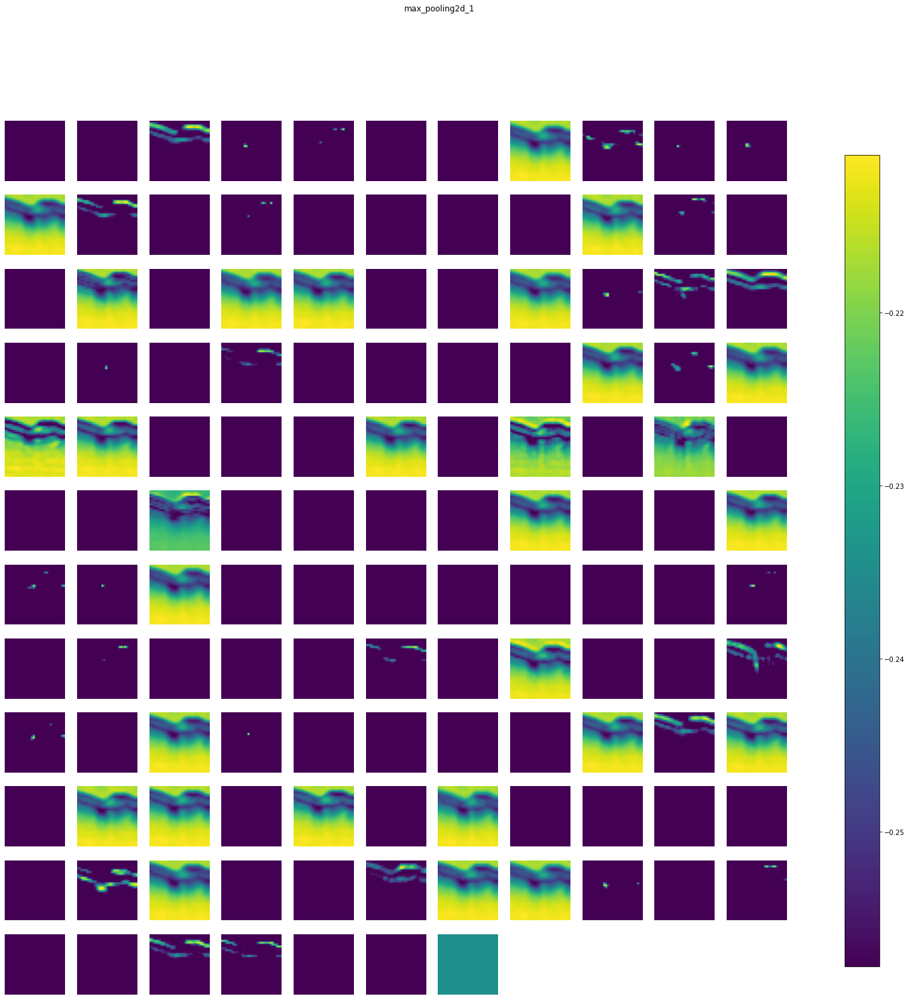

conv2d_4 (1, 30, 30, 64) 


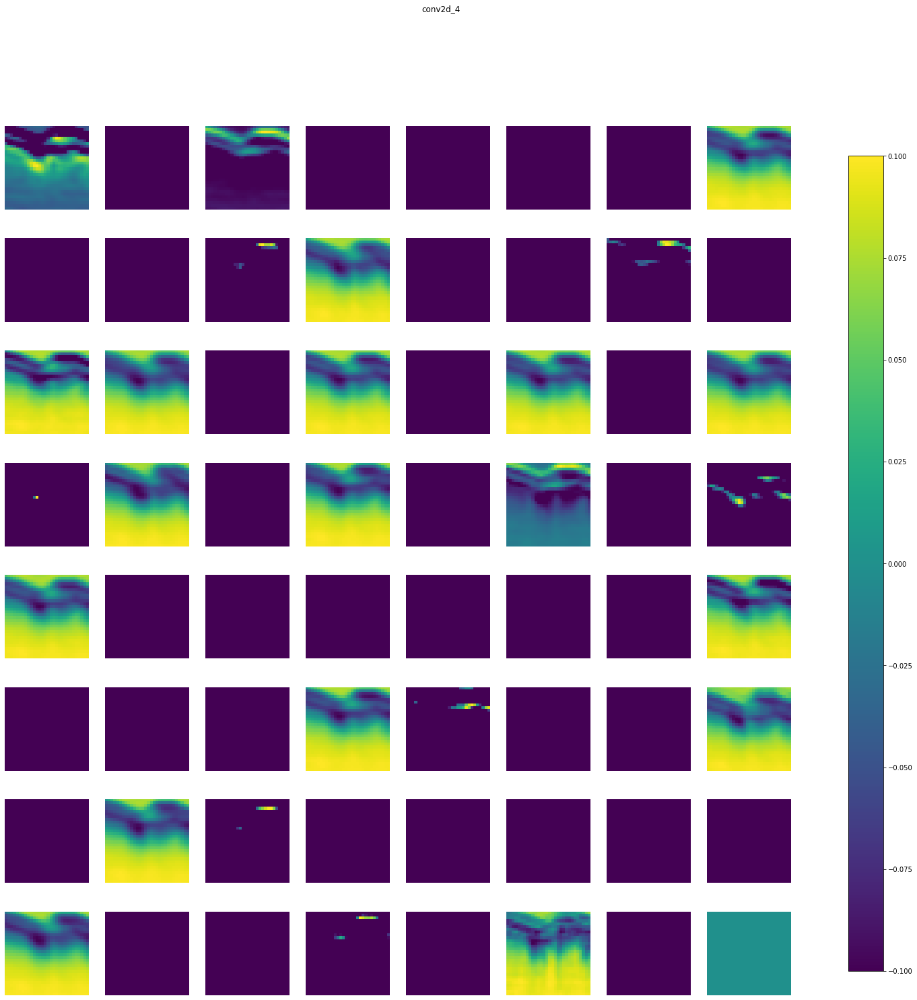

batch_normalization_4 (1, 30, 30, 64) 


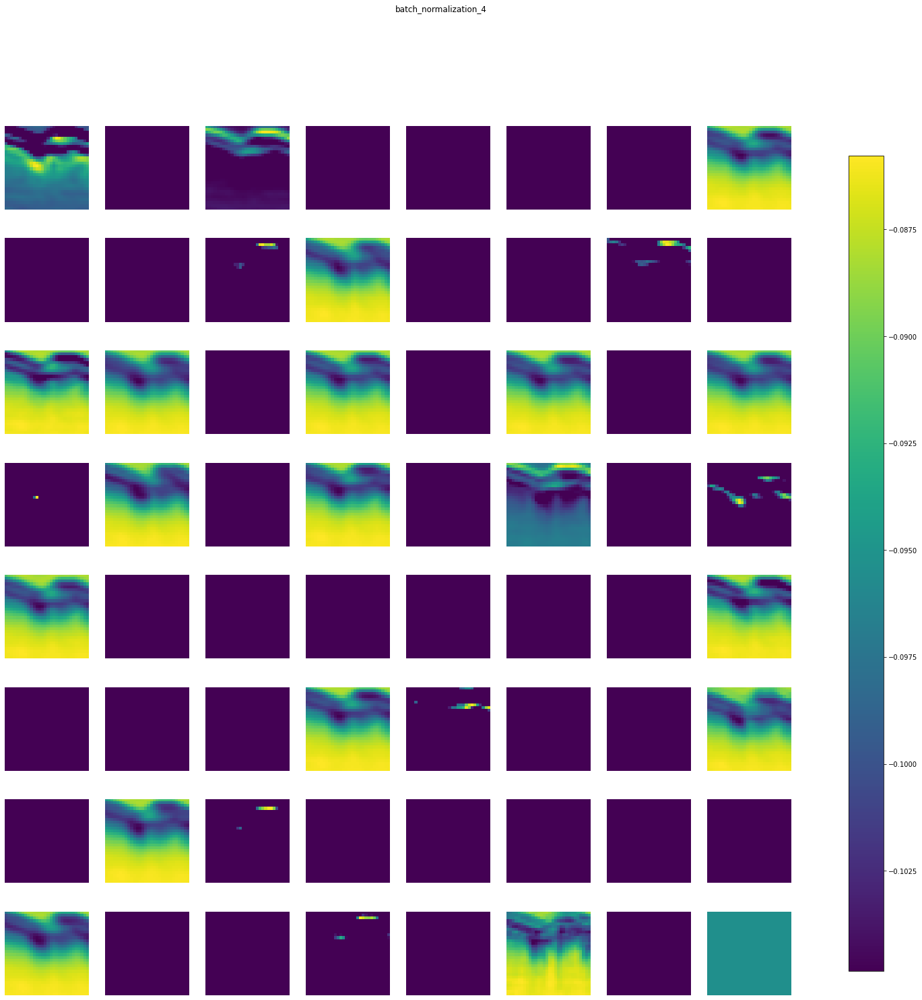

conv2d_5 (1, 28, 28, 64) 


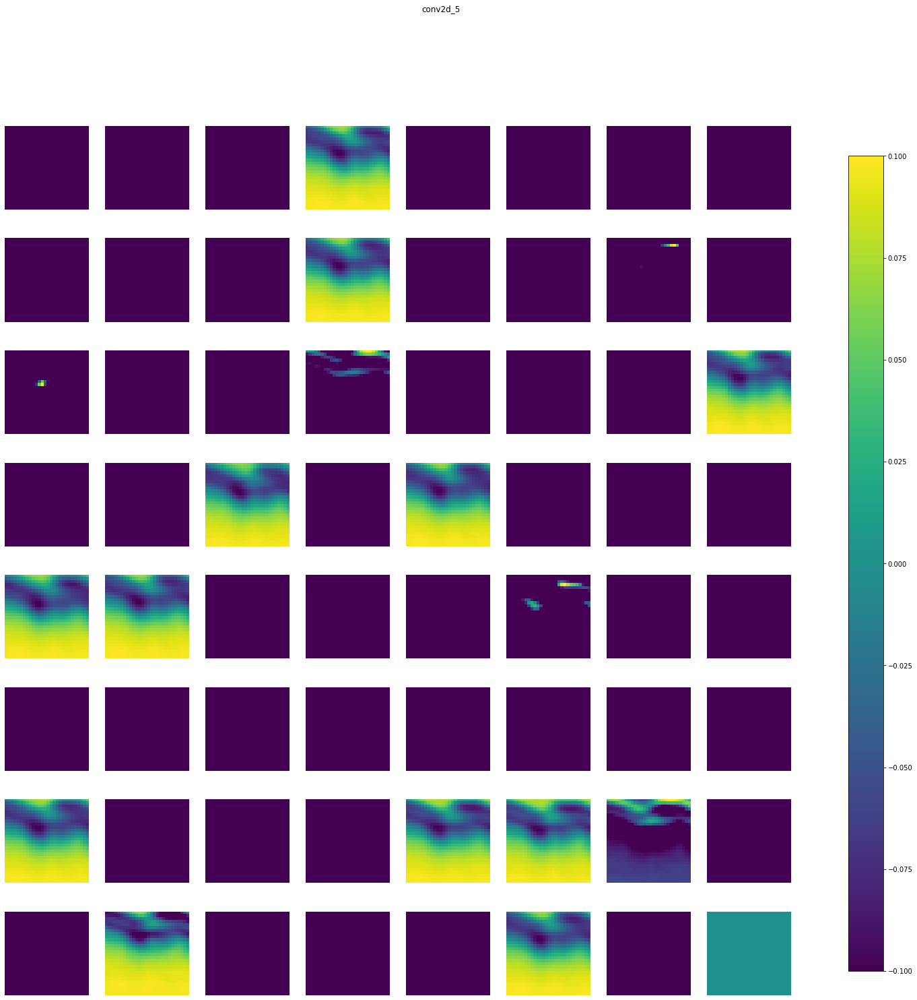

batch_normalization_5 (1, 28, 28, 64) 


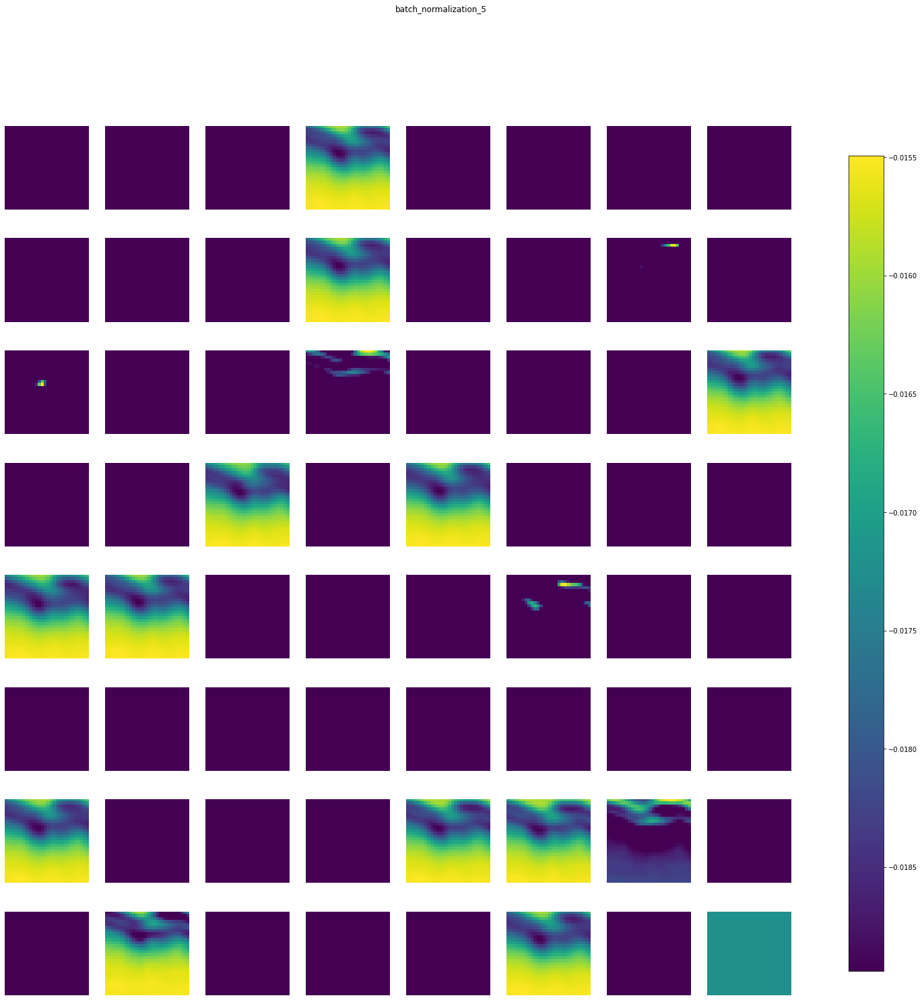

max_pooling2d_2 (1, 14, 14, 64) 


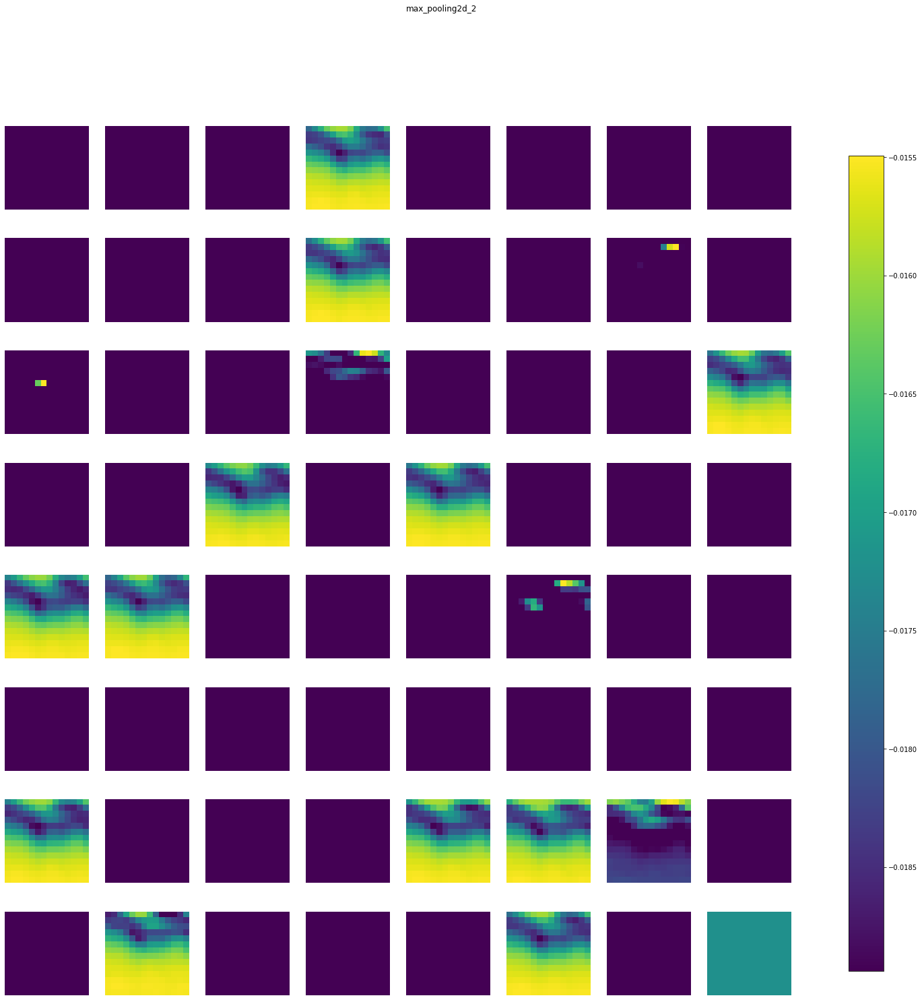

conv2d_6 (1, 10, 10, 32) 


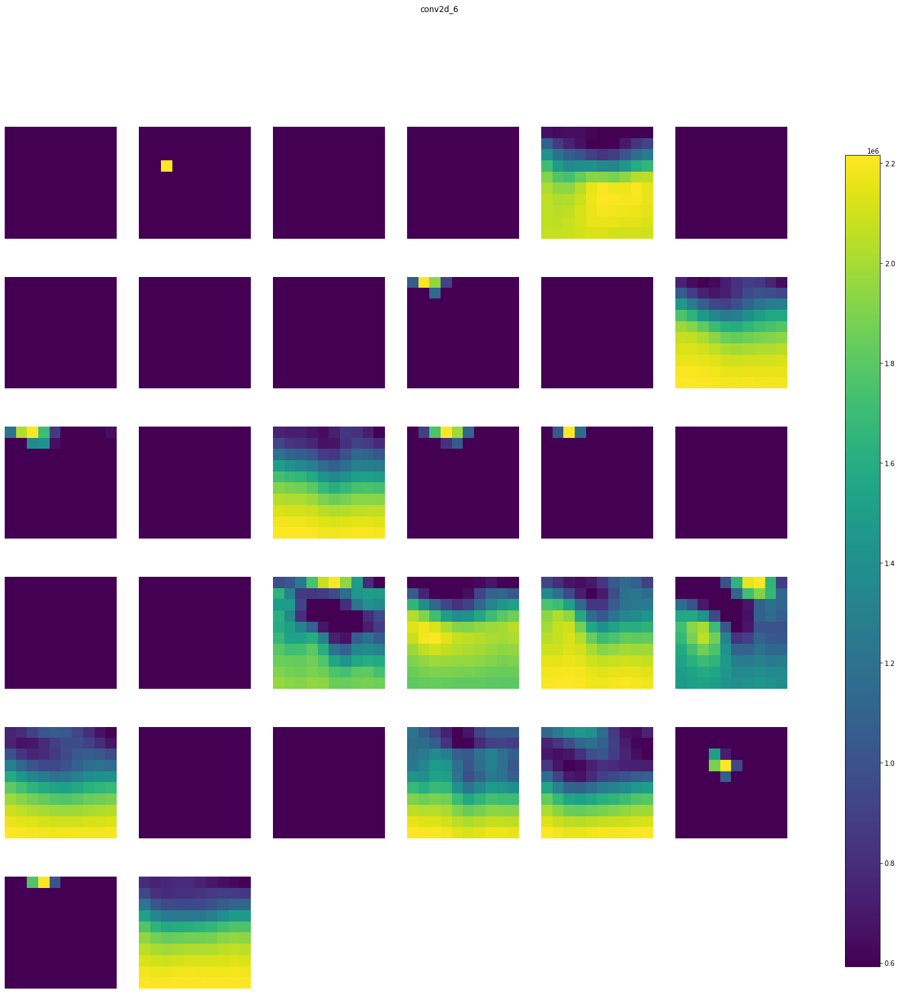

batch_normalization_6 (1, 10, 10, 32) 


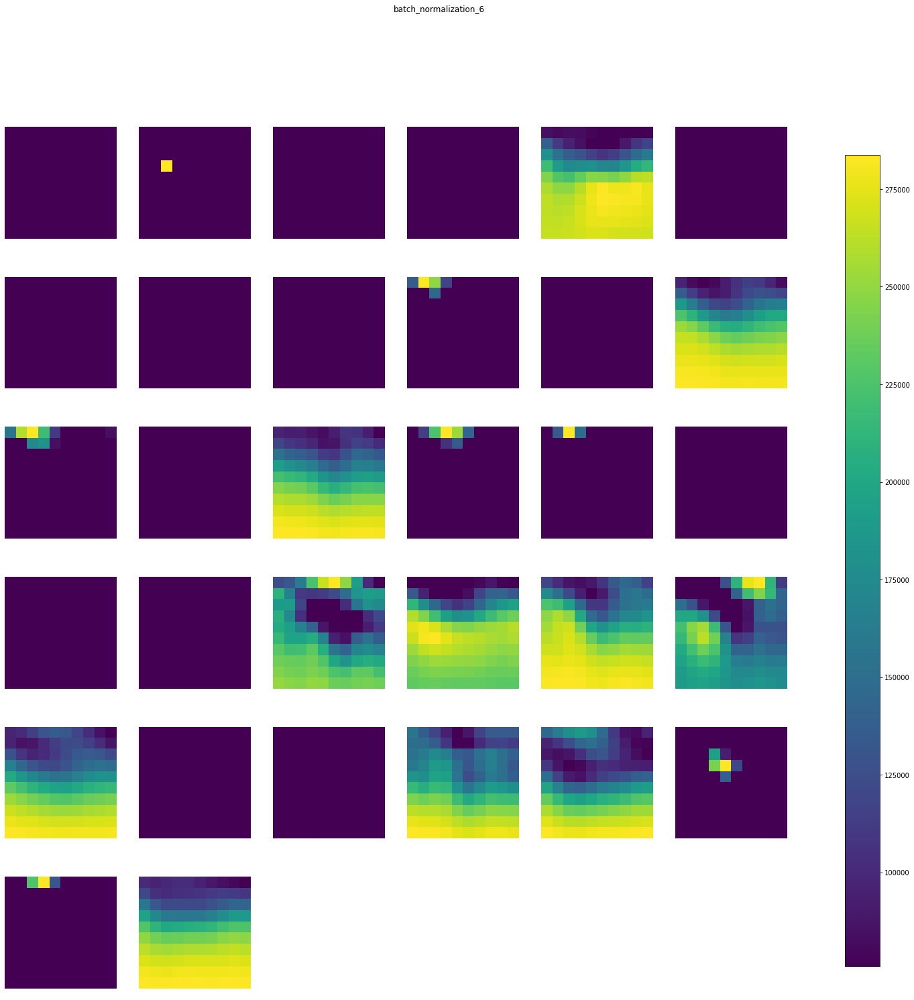

max_pooling2d_3 (1, 5, 5, 32) 


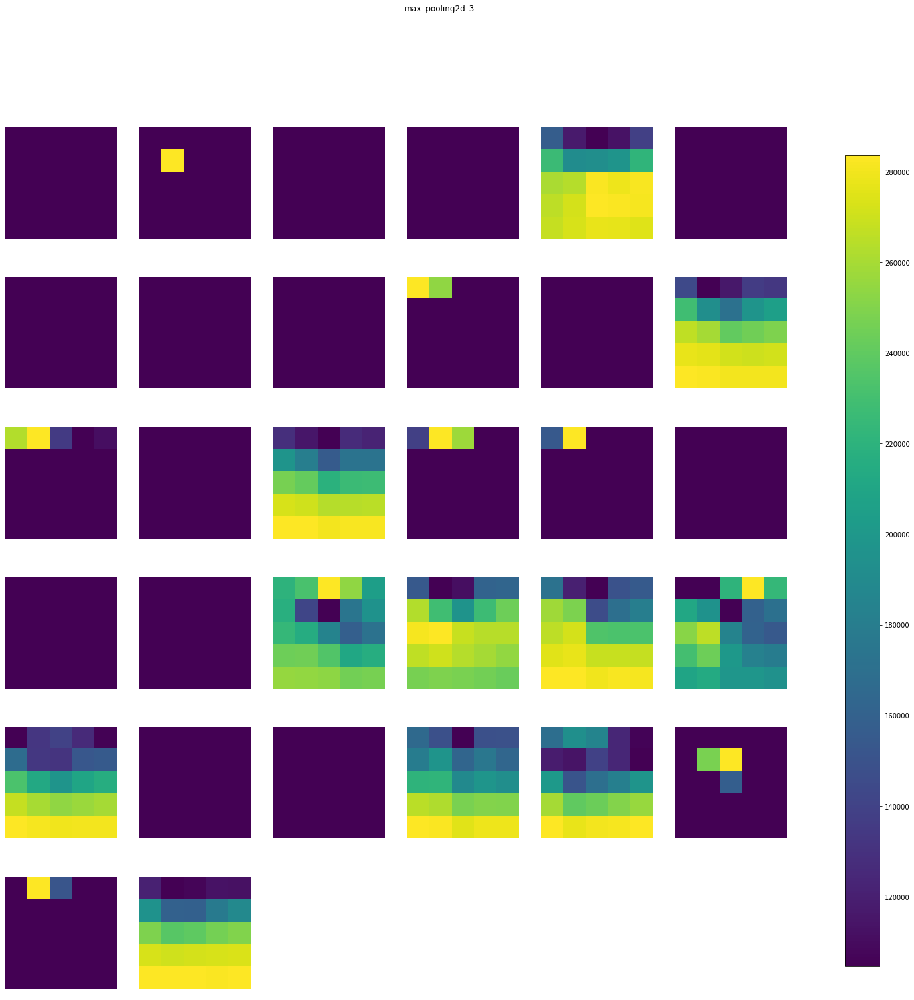

conv2d_7 (1, 3, 3, 16) 


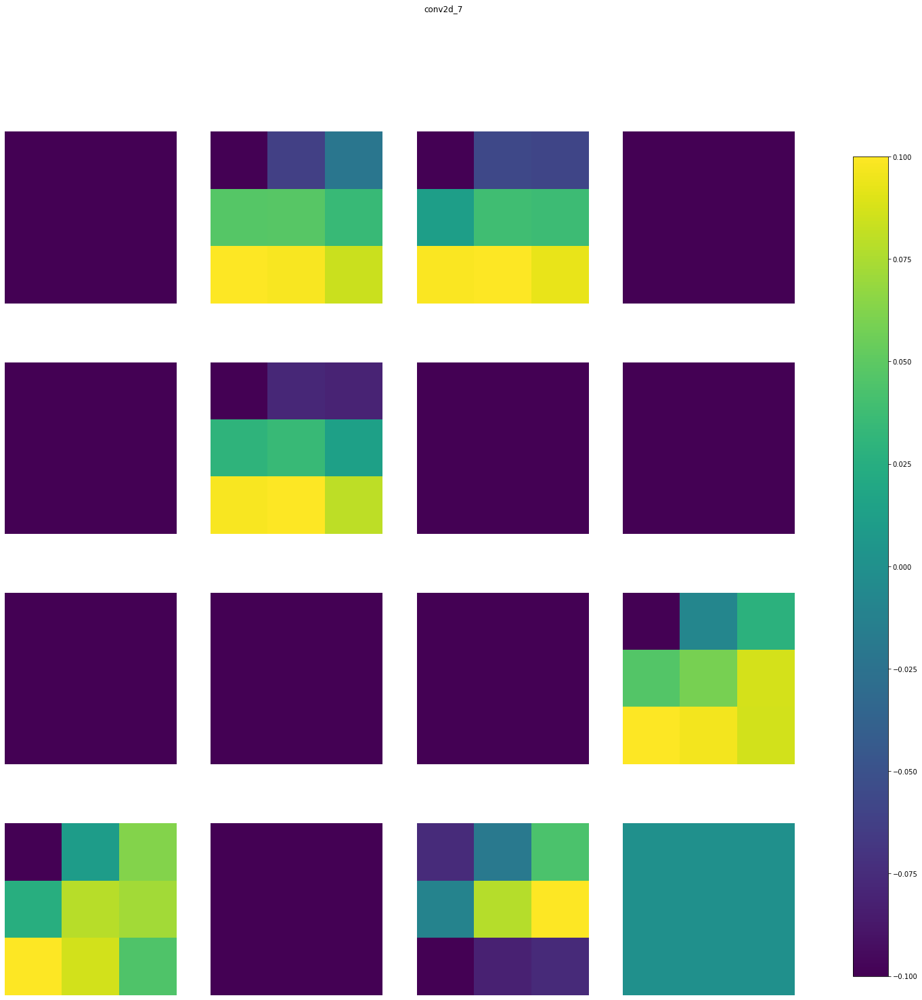

batch_normalization_7 (1, 3, 3, 16) 


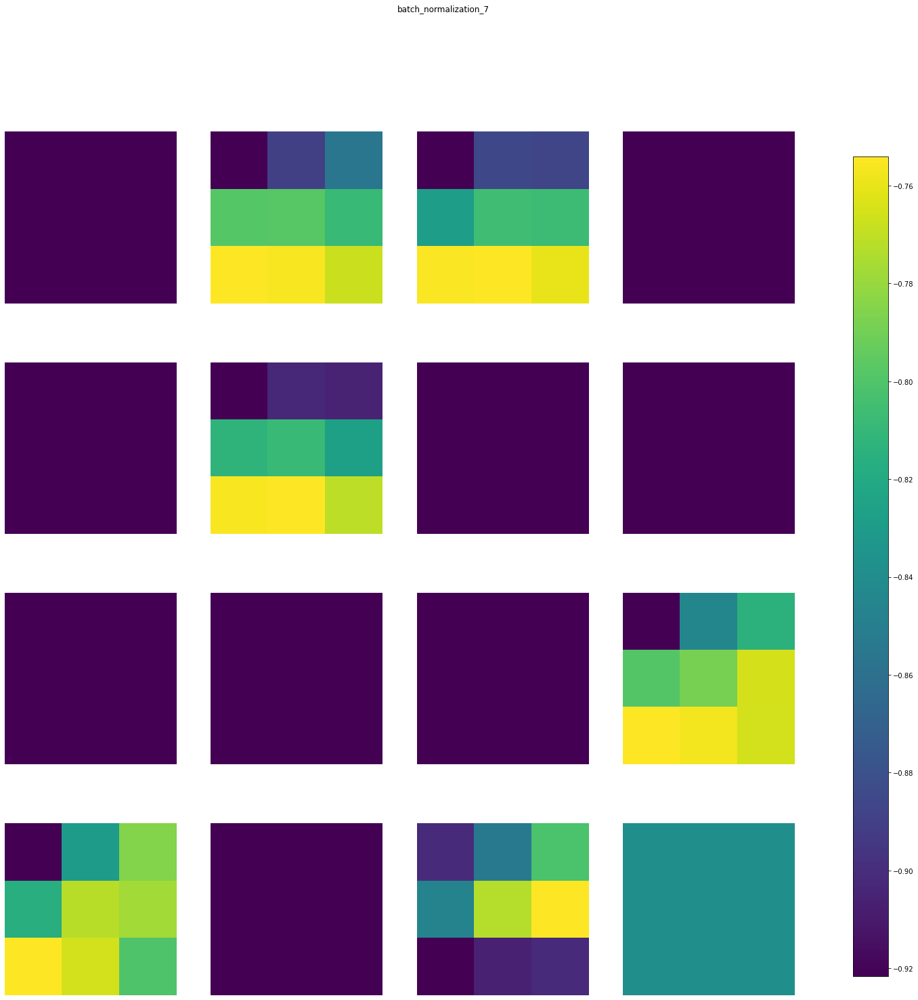

max_pooling2d_4 (1, 1, 1, 16) 


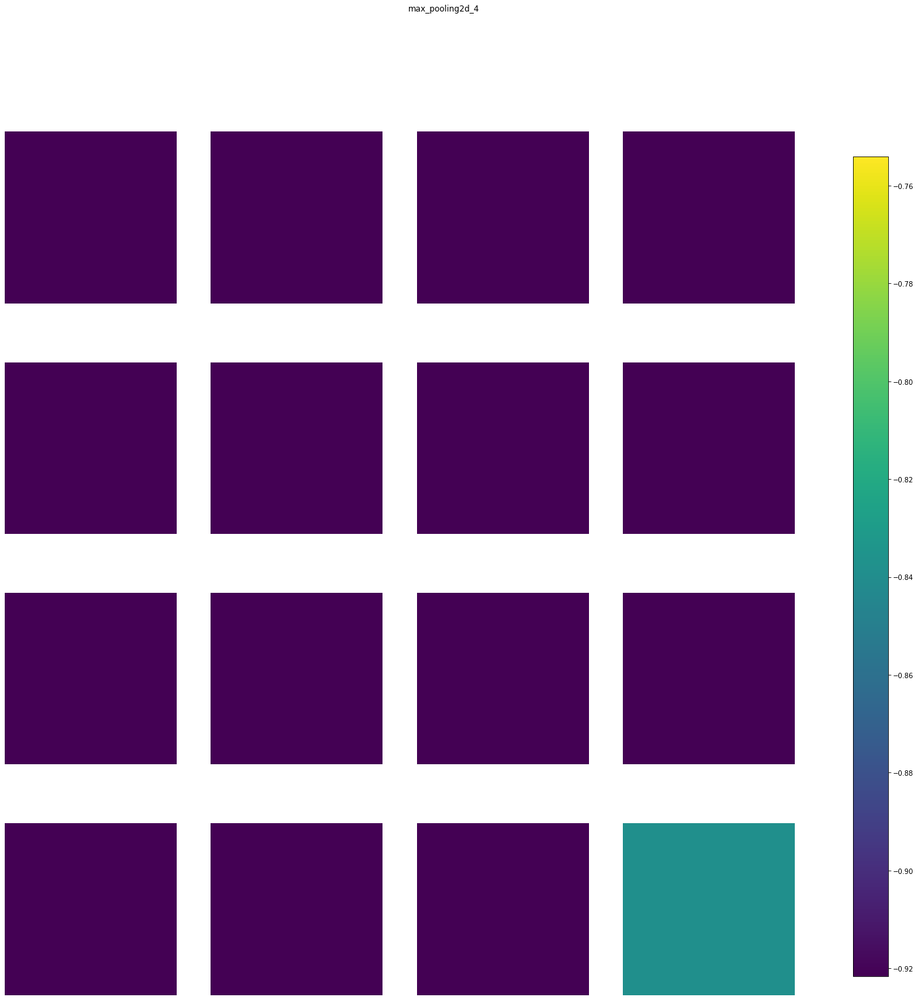

dropout (1, 1, 1, 16) 


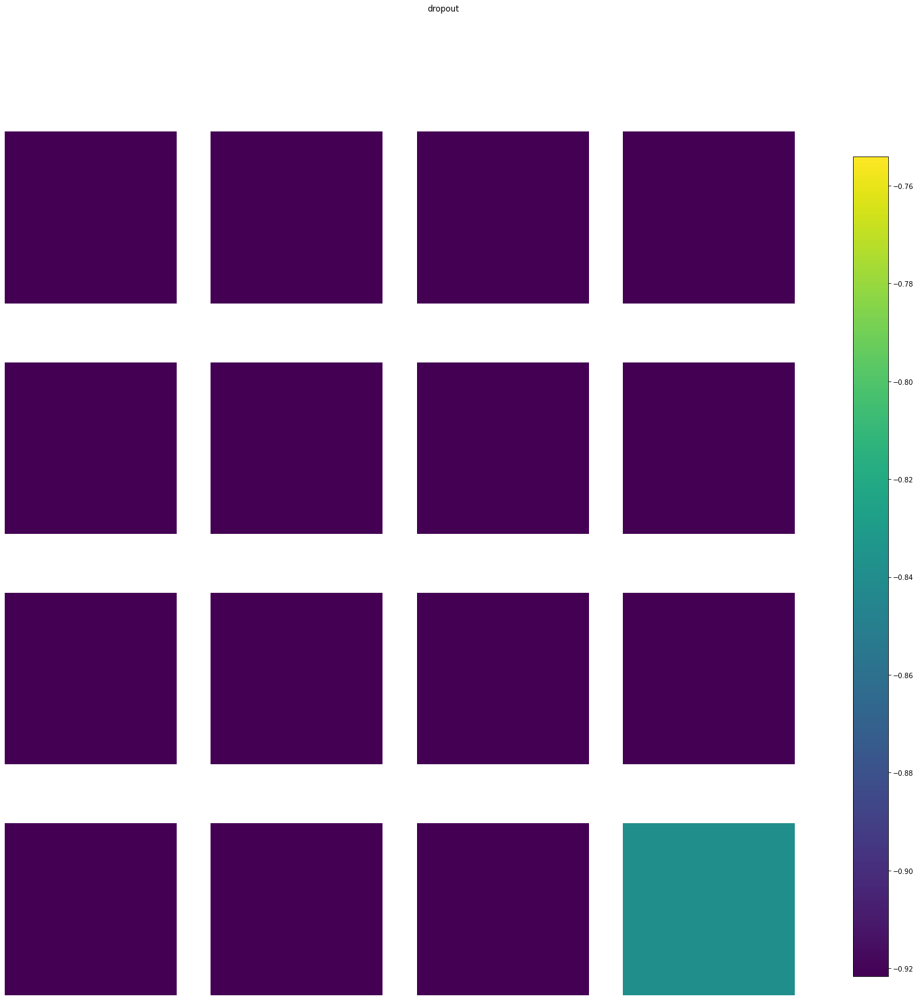

flatten (1, 16) 


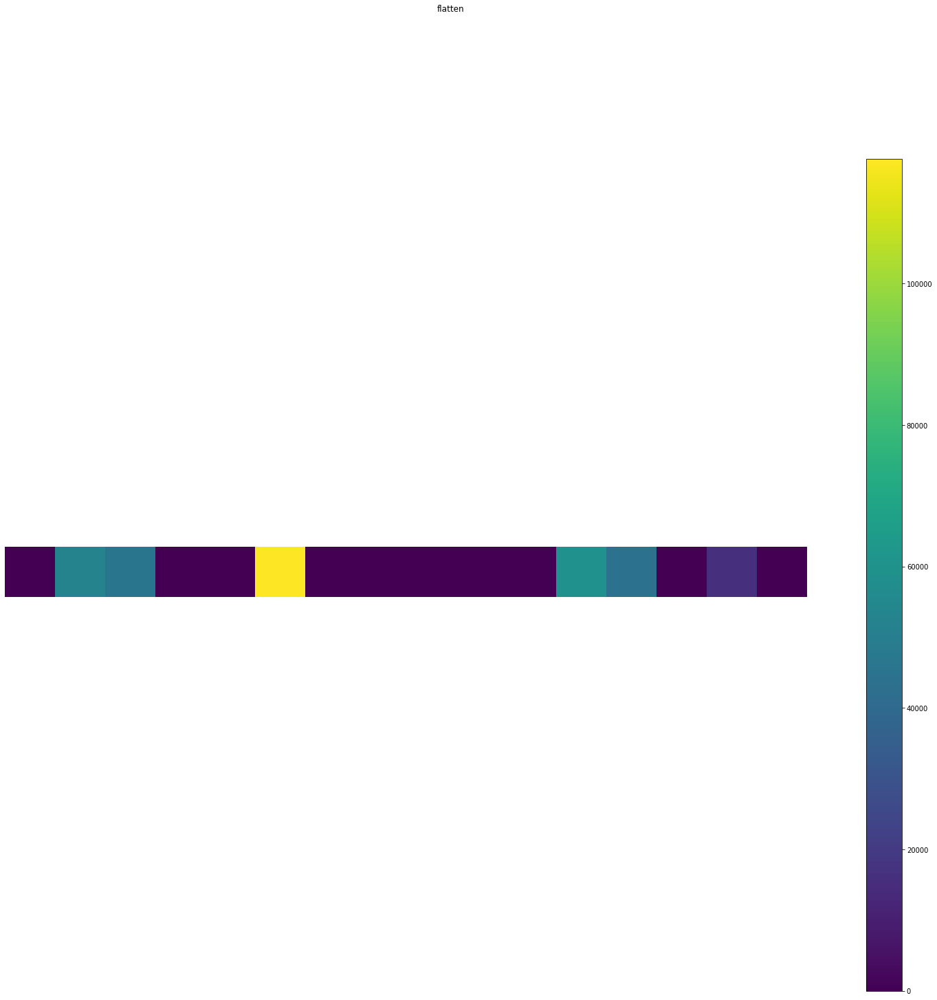

dense (1, 4) 


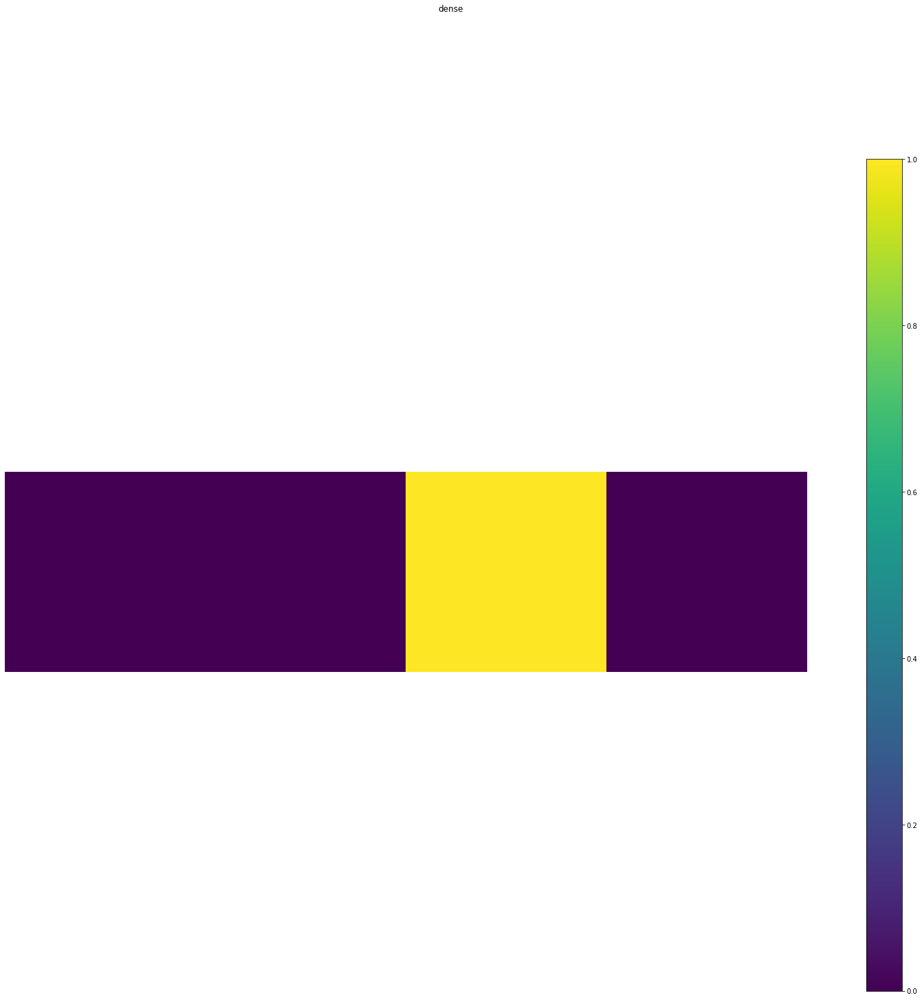

In [ ]:
image = load_img(TEST_DIR + '/CNV/CNV-103044-2.jpeg', target_size= (target_w, target_h))     
image = img_to_array(image)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
image = preprocess_input(image)

outputs = [layer.output for layer in model.layers]

activations_model = tf.keras.models.Model(model.inputs, outputs=outputs)
activations_model.compile(optimizer='adam', loss='categorical_crossentropy')

activations = activations_model.predict(image)
m={}

for i in range(len(activations)):
    m[model.layers[i].name]=activations[i]

keract.display_activations(m)

# MODEL APPLICATION

Saving dme.jpeg to dme.jpeg
[[2.789784e-35 1.000000e+00 0.000000e+00 0.000000e+00]]
dme.jpeg DME


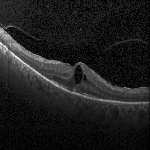

In [ ]:
from keras.preprocessing import image
from google.colab import files

uploaded=files.upload()

for fn in uploaded.keys():
 
  # predict
  path='/content/' + fn
  img=image.load_img(path, target_size=(150, 150))          
  x=image.img_to_array(img)
  x=np.expand_dims(x, axis=0)     #.reshape(1, w, h, c)
  images = np.vstack([x])
  
  classes = model.predict(images, batch_size=10)

  print(classes)
  
  if classes[0,0]==1.:
    print(fn + ' CNV')
  elif classes[0,1]==1.:
    print(fn + ' DME')
  elif classes[0,2]==1.: 
    print(fn + ' Drusen')
  elif classes[0,3]==1.:
    print(fn + ' Normal')
  else:
    print('model error')

img

Potential updates
 - scale down model, reduce training & inference time
 - freeze model and measure FLOPS
 - compute optimal learning rate